In [4]:
import skimage as skim
import sklearn 
import cv2
import numpy as np

import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import napari

In [5]:
train_data_path = '../data/dataset_project_iapr2025/train/'
easy_path = train_data_path + 'L1000756.JPG'
hard_path = train_data_path + 'L1010032.JPG'

### Visualisation

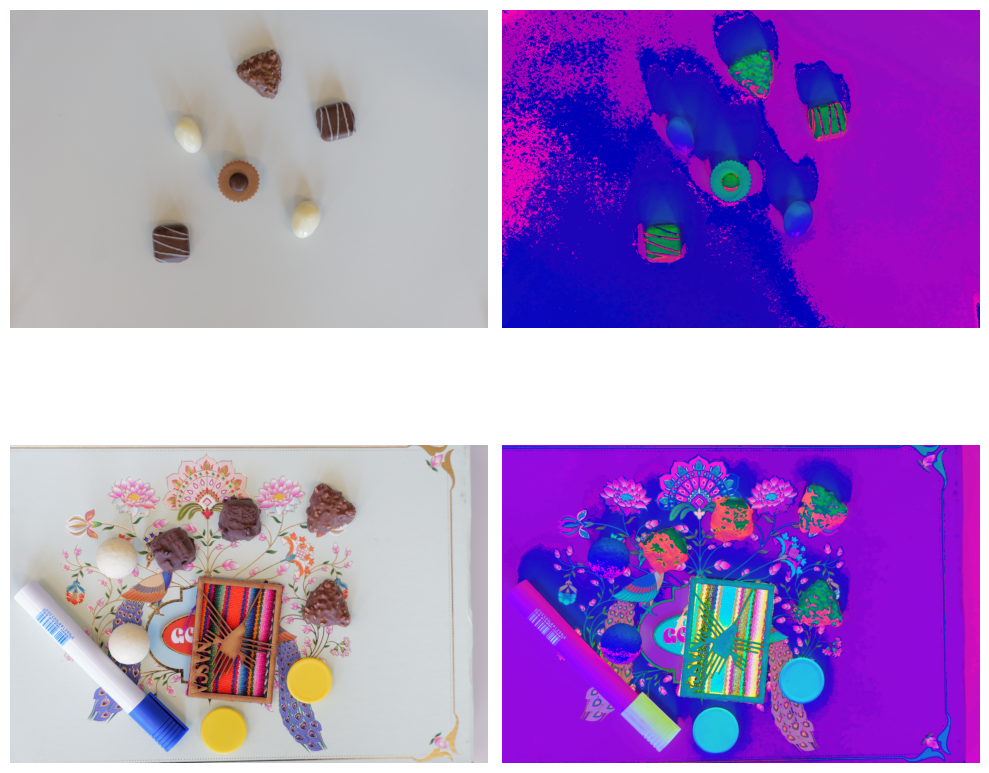

In [6]:


easy = np.array(Image.open(easy_path))
easy_hsv = skim.color.rgb2hsv(easy)

hard = np.array(Image.open(hard_path))
hard_hsv = skim.color.rgb2hsv(hard)

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(easy)
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(easy_hsv)
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(hard)
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(hard_hsv)
plt.axis('off')

plt.tight_layout()

plt.show()


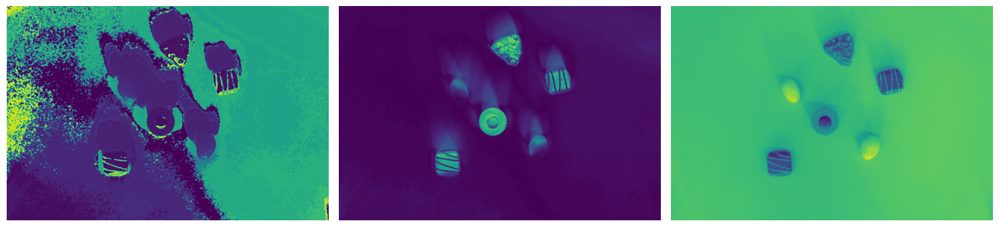

In [7]:

plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
plt.imshow(easy_hsv[:,:,0])
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(easy_hsv[:,:,1])
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(easy_hsv[:,:,2])
plt.axis('off')
plt.tight_layout()

plt.show()


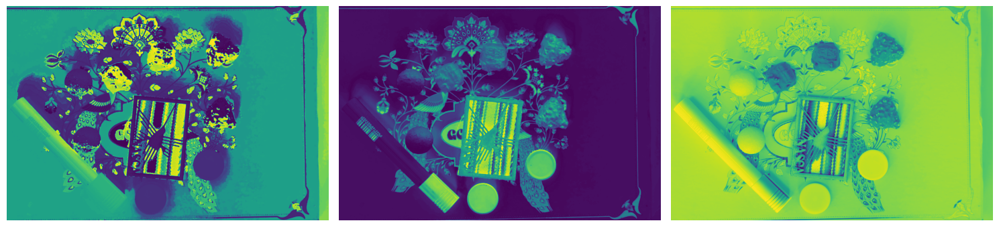

In [8]:
plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
plt.imshow(hard_hsv[:,:,0])
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(hard_hsv[:,:,1])
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(hard_hsv[:,:,2])
plt.axis('off')
plt.tight_layout()

plt.show()

**Histograms of HSV**

In [9]:
img = np.array(Image.open(hard_path))
img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

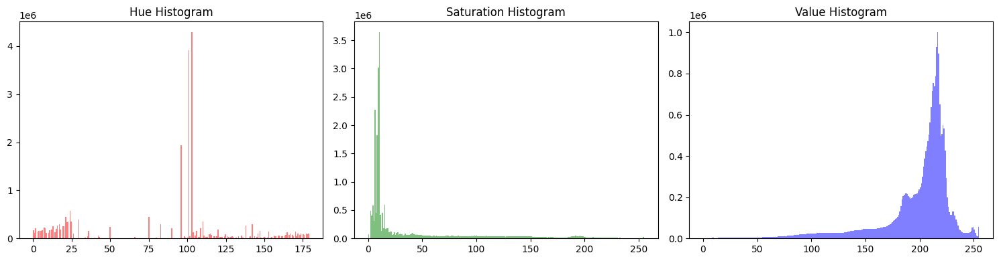

In [10]:
# visualize histograms
h = hsv[:,:,0]
s = hsv[:,:,1]
v = hsv[:,:,2]

plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.hist(h.ravel(), bins=256, color='r', alpha=0.5) 
plt.title('Hue Histogram')
plt.subplot(1, 3, 2)
plt.hist(s.ravel(), bins=256, color='g', alpha=0.5)
plt.title('Saturation Histogram')
plt.subplot(1, 3, 3)
plt.hist(v.ravel(), bins=256, color='b', alpha=0.5)
plt.title('Value Histogram')
plt.tight_layout()
plt.show()

**Histograms after sampling**

24000000


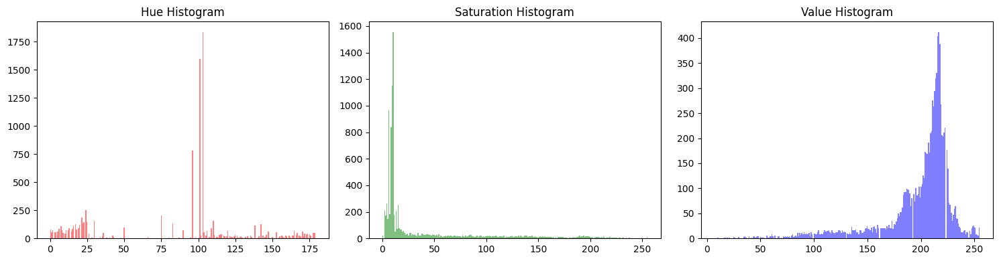

In [11]:
print(len(h.ravel()))

h = np.random.choice(h.ravel(), 10000)
s = np.random.choice(s.ravel(), 10000)
v = np.random.choice(v.ravel(), 10000)

plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.hist(h, bins=256, color='r', alpha=0.5)
plt.title('Hue Histogram')
plt.subplot(1, 3, 2)
plt.hist(s, bins=256, color='g', alpha=0.5)
plt.title('Saturation Histogram')
plt.subplot(1, 3, 3)
plt.hist(v, bins=256, color='b', alpha=0.5)
plt.title('Value Histogram')
plt.tight_layout()
plt.show()



### GMM for segmentation
**Preprocessing: binning and bluring**

In [12]:
### median binning

def median_bin_rgb(image, block_size=(2, 2)):
    channels = []
    for i in range(3):  # R, G, B
        channel = skim.measure.block_reduce(image[:, :, i], block_size=block_size, func=np.median)
        channels.append(channel)
    return np.stack(channels, axis=-1).astype(np.uint8)


(400, 600, 3)


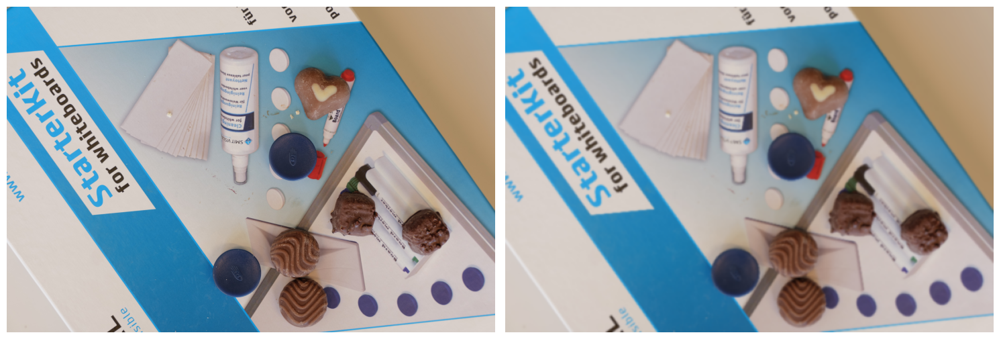

In [13]:
img = np.array(Image.open(train_data_path + 'L1000993.JPG'))
binned = median_bin_rgb(img, block_size=(10, 10))
binned = skim.filters.gaussian(binned, sigma=1, channel_axis=2, preserve_range=True).astype(np.uint8)
print(binned.shape)

plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(binned)
plt.axis('off')
plt.tight_layout()
plt.show()

In [14]:
img_bgr = cv2.cvtColor(binned, cv2.COLOR_RGB2BGR)
hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
#hsv = binned.copy()
#hsv = hsv[:,:, 1:3]
hsv = hsv.reshape(-1, 3)

empirical_mask = (hsv[:,0]>0) & (hsv[:,0]<100) & (hsv[:,1]>50) & (hsv[:,1]<200) & (hsv[:,2]>50) & (hsv[:,2]<180)


low_sat_mask = hsv[:, 1] < 0.2*255 #hue is very noisy when sat is low
hsv[low_sat_mask, 0] = 0


hsv_masked = hsv[empirical_mask]
components = range(1, 10)



sample_idx = np.random.choice(hsv_masked.shape[0], 10000, replace=False)
hsv_sample = hsv_masked[sample_idx, :]



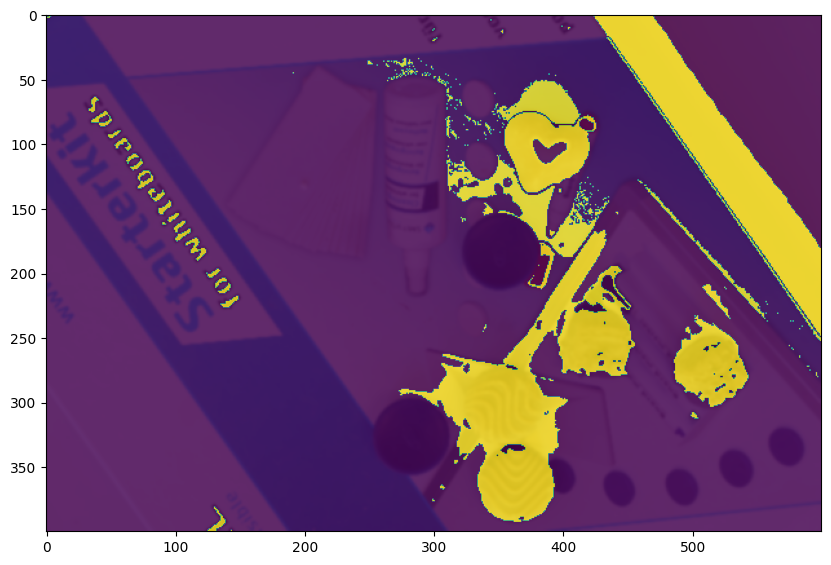

In [15]:
plt.figure(figsize=(10, 10))
plt.imshow(binned)
plt.imshow(empirical_mask.reshape(binned.shape[:2]), alpha=0.8)
plt.show()

**GMM clustering**

100%|██████████| 9/9 [00:12<00:00,  1.42s/it]


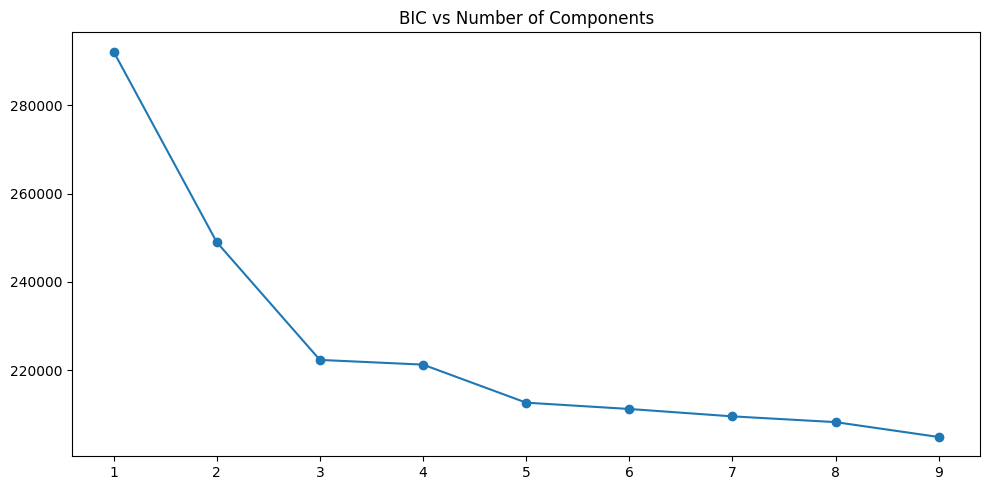

In [16]:
best_bic = np.inf
best_gmm = None
best_n_components = 0
bics = []

for c in tqdm(components):
    gmm = sklearn.mixture.GaussianMixture(n_components=c, covariance_type='full', reg_covar=1e-3)
    gmm.fit(hsv_sample)
    bic = gmm.bic(hsv_sample)
    bics.append(bic)
    if bic < best_bic:
        best_bic = bic
        best_gmm = gmm
        best_n_components = c

plt.figure(figsize=(10, 5))
plt.plot(components, bics, marker='o')
plt.title('BIC vs Number of Components')
plt.tight_layout()
plt.show()  


0 8


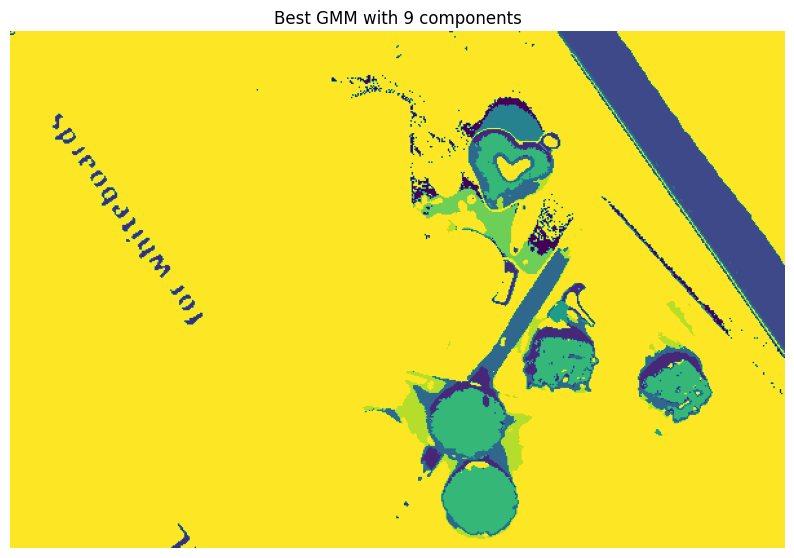

In [17]:
labels = best_gmm.predict(hsv)
print(np.min(labels), np.max(labels))
labels[~empirical_mask] = np.max(labels)+1
labels = labels.reshape(binned.shape[0], binned.shape[1])
plt.figure(figsize=(10, 10))
plt.imshow(labels)
plt.axis('off')
plt.title(f'Best GMM with {best_n_components} components')
plt.show()

In [18]:
print(best_gmm.means_)

[[ 99.         114.02680881 152.02911477]
 [  9.38203505 112.44951683  91.30673263]
 [ 16.62896736 104.2432373  171.30016274]
 [  9.85100221  77.32984886 134.74103407]
 [ 95.86437974 123.95182188 116.48413693]
 [ 30.8562799   81.23387174  76.46586109]
 [  8.26381298 141.56340231 103.24882769]
 [ 96.65467744  64.83173897 150.58205845]
 [  8.30543902  57.39585343 160.30093288]]


(np.float64(-0.5), np.float64(599.5), np.float64(399.5), np.float64(-0.5))

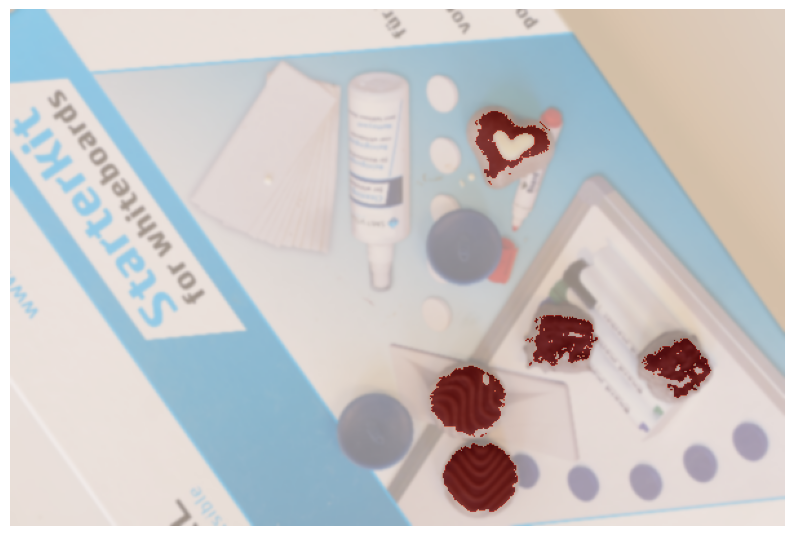

In [19]:
benchmark = [10, 125, 115]

distances = np.linalg.norm(best_gmm.means_ - benchmark, axis=1)
idx = np.argmin(distances)

binary = labels == idx
plt.figure(figsize=(10, 10))
plt.imshow(binned)
plt.imshow(binary, alpha=0.5, cmap='Reds')
plt.axis('off')




### Stonks Segmentation

In [20]:
#img = np.array(Image.open(train_data_path + 'L1000993.JPG'))
img = np.array(Image.open('../data/dataset_project_iapr2025/references/' + 'Tentation_noir.JPG'))
binned = median_bin_rgb(img, block_size=(10, 10))

binned_bgr = cv2.cvtColor(binned, cv2.COLOR_RGB2BGR)
binned_hsv = cv2.cvtColor(binned_bgr, cv2.COLOR_BGR2HSV)

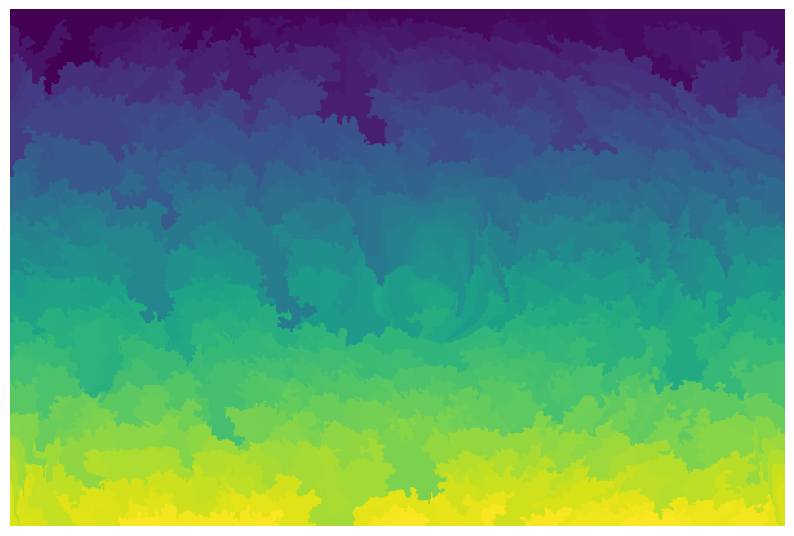

In [21]:
spx = skim.segmentation.slic(binned, n_segments=1000, compactness=0.1, sigma=1)

feat_img = np.zeros((binned.shape[0], binned.shape[1], 4), dtype=float)
S = binned_hsv[:, :, 1]/255
V = binned_hsv[:, :, 2]/255
#feat_img[:,:,0] = np.cos(binned_hsv[:, :, 0]*2*np.pi/255)
feat_img[:,:,0] = binned_hsv[:, :, 0]/255
feat_img[:,:,1] = S
feat_img[:,:,2] = V

plt.figure(figsize=(10, 10))
plt.imshow(spx)
plt.axis('off')
plt.show()

In [22]:
feat_spx = np.zeros((np.max(spx), 6), dtype=float)
rows, cols = np.indices(binned.shape[:2])


#compute features for each superpixel
for seg_id in range(1, np.max(spx)):
    mask = spx == seg_id
    feat_spx[seg_id, 0] = np.mean(feat_img[mask, 0])
    feat_spx[seg_id, 1] = np.mean(feat_img[mask, 1])
    feat_spx[seg_id, 2] = np.mean(feat_img[mask, 2])
    feat_spx[seg_id, 3] = np.mean(feat_img[mask, 3])

    feat_spx[seg_id, 4] = np.mean(rows[mask])
    feat_spx[seg_id, 5] = np.mean(cols[mask])

X = sklearn.preprocessing.StandardScaler().fit_transform(feat_spx)
print(np.mean(X, axis=0)) #standardize features

[ 1.30739575e-15  3.83801937e-16  2.81403688e-15  0.00000000e+00
 -4.58868153e-16 -1.11165924e-15]


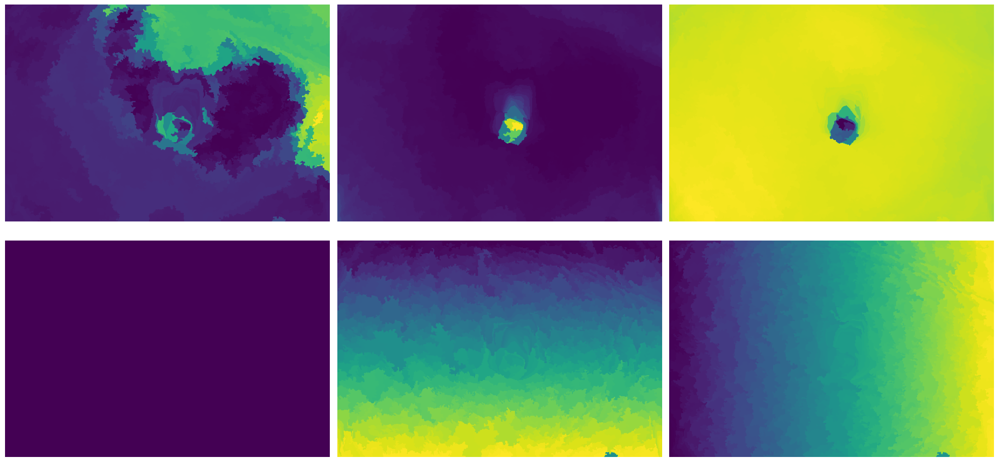

In [23]:
huex_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
huey_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
value_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
saturation_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
posx_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
posy_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)

for seg_id in range(1, np.max(spx)):
    mask = spx == seg_id
    huex_img[mask] = X[seg_id, 0]
    huey_img[mask] = X[seg_id, 1]
    saturation_img[mask] = X[seg_id, 2]
    value_img[mask] = X[seg_id, 3]
    posx_img[mask] = X[seg_id, 4]
    posy_img[mask] = X[seg_id, 5]
plt.figure(figsize=(20, 10))
plt.subplot(2, 3, 1)
plt.imshow(huex_img)
plt.axis('off')
plt.subplot(2, 3, 2)
plt.imshow(huey_img)
plt.axis('off')
plt.subplot(2, 3, 3)
plt.imshow(saturation_img)
plt.axis('off')
plt.subplot(2, 3, 4)
plt.imshow(value_img)
plt.axis('off')
plt.subplot(2, 3, 5)
plt.imshow(posx_img)
plt.axis('off')
plt.subplot(2, 3, 6)
plt.imshow(posy_img)
plt.axis('off')
plt.tight_layout()
plt.show()

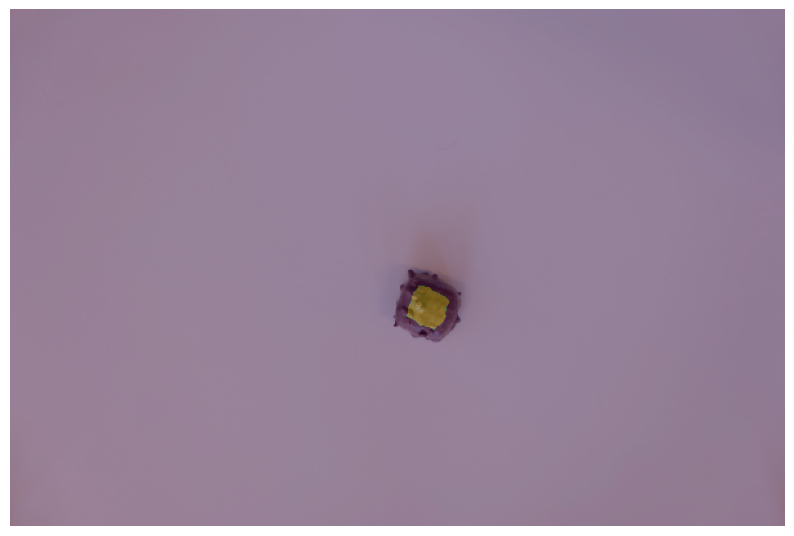

In [24]:
reference = np.array(Image.open('../data/dataset_project_iapr2025/references/' + 'Tentation_noir.JPG'))
reference = median_bin_rgb(reference, block_size=(10, 10))
reference_mask = np.array(Image.open('../data/dataset_project_iapr2025/references_annotated/' + 'tentation_noir_annotated.tif'), dtype=bool)
reference_mask = skim.measure.block_reduce(reference_mask, block_size=(10, 10), func=np.max).astype(bool)

reference_mask = skim.morphology.erosion(reference_mask, skim.morphology.disk(10))

plt.figure(figsize=(10, 10))
plt.imshow(reference)
plt.imshow(reference_mask, alpha=0.3)
plt.axis('off')
plt.show()

(759, 3)
(400, 600, 3)
[0.55927179 0.58647968 0.58747098 0.59161003 0.60536348 0.61042563
 0.61138333 0.61748696 0.61942199 0.6279183  0.7117202  0.63899091
 0.72520884 0.70997551 0.70724123 0.69704455 0.6742614  0.66879445
 0.66979114 0.66618994 0.68251265 0.68747838 0.68952414 0.69281158
 0.70829841 0.70471729 0.72928561 0.69898284 0.66891706 0.6119243
 0.63904447 0.64535388 0.63892333 0.71366894 0.73116365 0.71083341
 0.60064135 0.70324934 0.67431199 0.61454414 0.61771345 0.72980208
 0.68266961 0.59085087 0.66527096 0.61980796 0.72261326 0.70897832
 0.6156996  0.63166966 0.68646973 0.68569979 0.68394072 0.70789788
 0.72735688 0.69874037 0.71408995 0.71154363 0.70619339 0.70487332
 0.71009796 0.62216612 0.62470335 0.61636932 0.64512738 0.70194137
 0.63583734 0.72536862 0.70382265 0.64604167 0.69976092 0.68480259
 0.64012915 0.71660156 0.69650955 0.68221011 0.7170516  0.68788764
 0.59273024 0.72083795 0.71408349 0.6793259  0.60815161 0.61334617
 0.71548078 0.71194012 0.60643473 0.6016

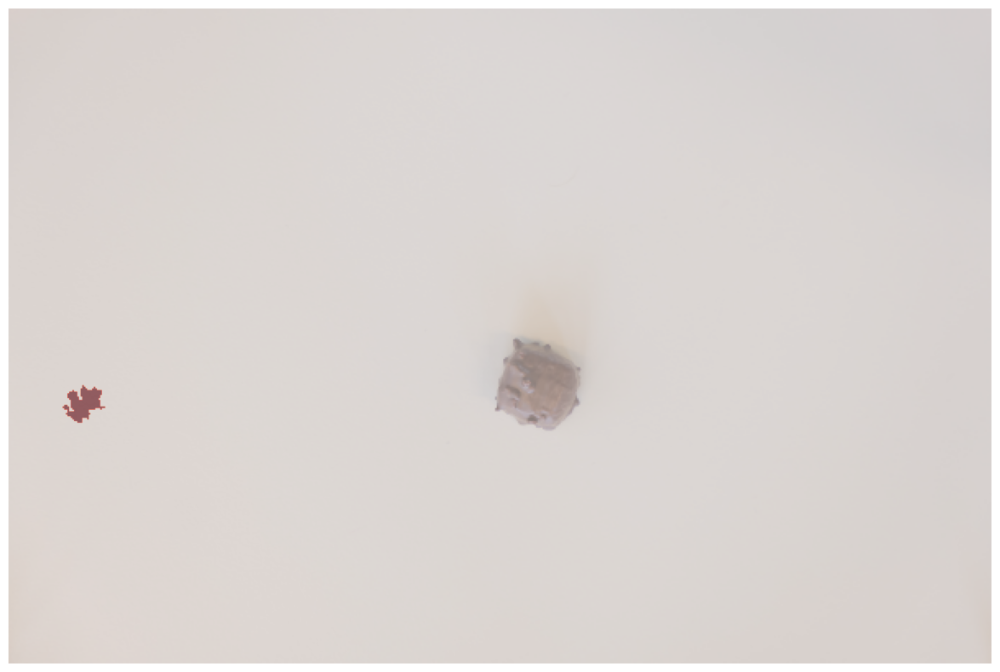

In [25]:
reference_bgr = cv2.cvtColor(reference, cv2.COLOR_RGB2BGR)
reference_hsv = cv2.cvtColor(reference_bgr, cv2.COLOR_BGR2HSV)
data = reference_hsv[reference_mask==1]
print(data.shape)
print(reference_bgr.shape)

ref_feat_mean = np.zeros(3, dtype=float)

ref_S = np.mean(data[:, 1])/255
ref_V = np.mean(data[:, 2])/255
ref_H = np.mean(data[:, 0])/255
ref_feat_mean[0] = ref_H
ref_feat_mean[1] = ref_S
ref_feat_mean[2] = ref_V

dist_to_ref = np.zeros(np.max(spx), dtype=float)
img_dist_to_ref = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)

for seg_id in range(1, np.max(spx)+1):
    mask = spx == seg_id
    dist_to_ref[seg_id-1] = np.linalg.norm(ref_feat_mean - feat_spx[seg_id-1, :3])
    img_dist_to_ref[mask] = dist_to_ref[seg_id-1]

print(dist_to_ref)
plt.figure(figsize=(15, 10))
plt.imshow(binned)
plt.imshow(img_dist_to_ref<0.1, alpha=0.5, cmap='Reds')
plt.axis('off')
plt.show()


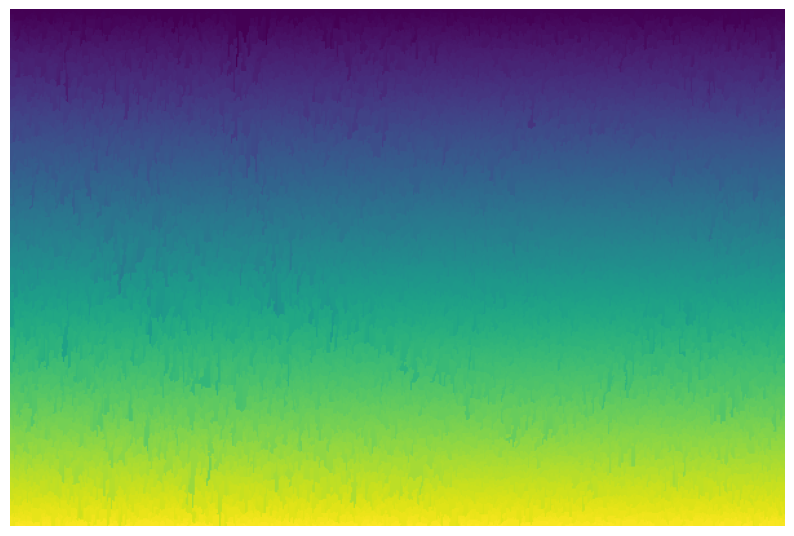

In [26]:
spx = skim.segmentation.slic(binned, n_segments=20000, compactness=0.03, sigma=.5, )

feat_img = np.zeros((binned.shape[0], binned.shape[1], 4), dtype=float)
feat_img[:,:,0] = binned_hsv[:,:, 0]/255
feat_img[:,:,1] = binned_hsv[:,:, 1]/255
feat_img[:,:,2] = binned_hsv[:,:, 2]/255

plt.figure(figsize=(10, 10))
plt.imshow(spx)
plt.axis('off')
plt.show()

In [27]:
feat_spx = np.zeros((np.max(spx), 5), dtype=float)
print(np.min(spx), np.max(spx))
cols, rows = np.indices(binned.shape[:2])
#compute features for each superpixel
for seg_id in range(1, np.max(spx)+1):
    mask = spx == seg_id
    feat_spx[seg_id-1, 0] = np.mean(feat_img[mask, 0])
    feat_spx[seg_id-1, 1] = np.mean(feat_img[mask, 1])
    feat_spx[seg_id-1, 2] = np.mean(feat_img[mask, 2])


1 11497


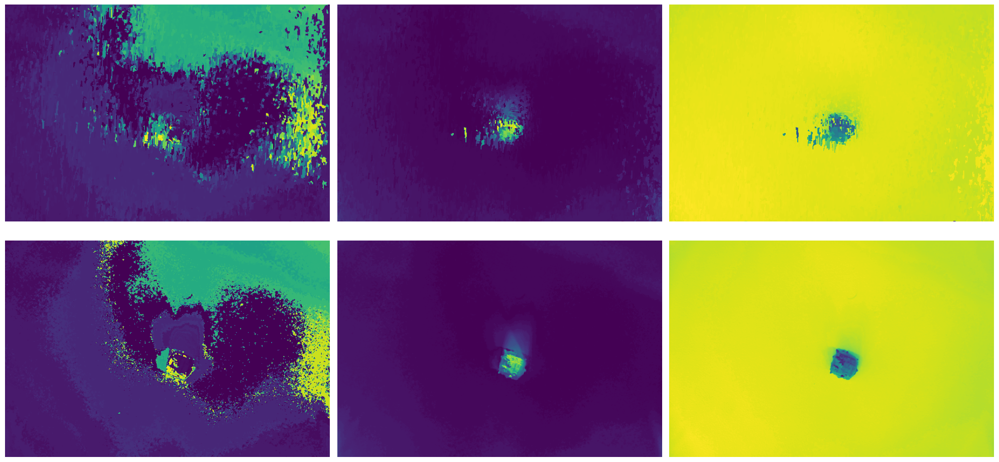

In [28]:
h_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
s_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
v_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)

for seg_id in range(1, np.max(spx)):
    mask = spx == seg_id
    h_img[mask] = feat_spx[seg_id, 0]
    s_img[mask] = feat_spx[seg_id, 1]
    v_img[mask] = feat_spx[seg_id, 2]
plt.figure(figsize=(20, 10))
plt.subplot(2, 3, 4)
plt.imshow(binned_hsv[:,:, 0])
plt.axis('off')
plt.subplot(2, 3, 5)
plt.imshow(binned_hsv[:,:, 1])
plt.axis('off')
plt.subplot(2, 3, 6)
plt.imshow(binned_hsv[:,:, 2])
plt.axis('off')
plt.subplot(2, 3, 1)
plt.imshow(h_img)
plt.axis('off')
plt.subplot(2, 3, 2)
plt.imshow(s_img)
plt.axis('off')
plt.subplot(2, 3, 3)
plt.imshow(v_img)
plt.axis('off')
plt.tight_layout()
plt.show()

In [29]:
data = reference_hsv[reference_mask==1]

ref_feat_mean = np.zeros(3, dtype=float)


ref_feat_mean[0] = np.mean(data[:, 1])/255
ref_feat_mean[1] = np.mean(data[:, 2])/255
ref_feat_mean[2] = np.mean(data[:, 0])/255

print(ref_feat_mean)

dist_to_ref = np.zeros(np.max(spx), dtype=float)
img_dist_to_ref = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
ref_dist_to_ref = np.linalg.norm(ref_feat_mean - reference_hsv/255, axis=2)

for seg_id in range(1, np.max(spx)+1):
    mask = spx == seg_id
    dist_to_ref[seg_id-1] = np.linalg.norm(ref_feat_mean - feat_spx[seg_id-1, :])
    img_dist_to_ref[mask] = dist_to_ref[seg_id-1]

viewer = napari.Viewer()
viewer.add_image(binned, name='binned')
viewer.add_image(img_dist_to_ref, name='dist to ref')
viewer.add_image(ref_dist_to_ref)
napari.run()

[0.46657883 0.2895244  0.10613552]


ValueError: operands could not be broadcast together with shapes (3,) (5,) 

### Au propre

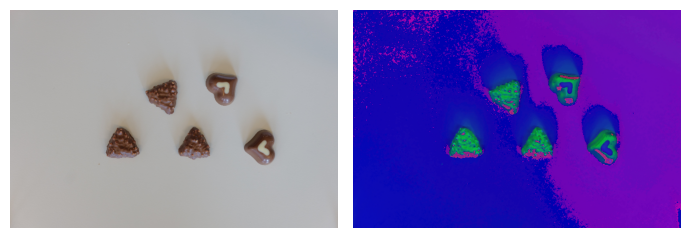

In [ ]:
img = np.array(Image.open(train_data_path + 'L1000765.JPG'))
#img = np.array(Image.open('../data/dataset_project_iapr2025/references/' + 'Tentation_noir.JPG'))
binned = median_bin_rgb(img, block_size=(10, 10))

binned_bgr = cv2.cvtColor(binned, cv2.COLOR_RGB2BGR)
binned_hsv = cv2.cvtColor(binned_bgr, cv2.COLOR_BGR2HSV)

plt.figure(figsize=(7, 4))
plt.subplot(1, 2, 1)
plt.imshow(binned)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(binned_hsv)
plt.axis('off')
plt.tight_layout()
plt.show()

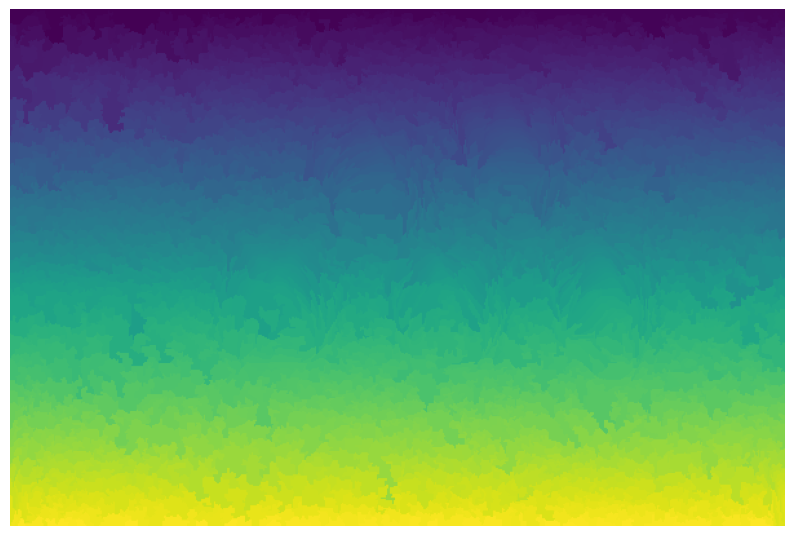

In [ ]:
spx = skim.segmentation.slic(binned, n_segments=5000, compactness=.1, sigma=1, start_label=0)
plt.figure(figsize=(10, 7))
plt.imshow(spx)
plt.axis('off')
plt.show()

**Features in HSV**

0 2943


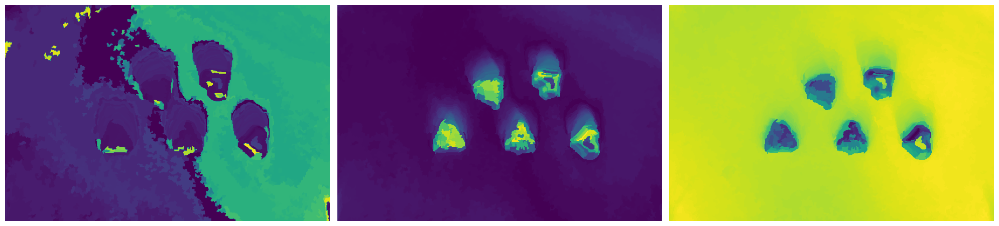

In [ ]:
feat_spx = np.zeros((np.max(spx)+1, 5), dtype=float)
rows, cols = np.indices(binned.shape[:2], dtype=float)
feat_img = np.zeros_like(binned_hsv, dtype=float)
print(np.min(spx), np.max(spx))

for i in range(np.max(spx)+1):
    mask = spx == i
    feat_spx[i, 0] = np.median(binned_hsv[mask, 0])/255
    feat_spx[i, 1] = np.median(binned_hsv[mask, 1])/255
    feat_spx[i, 2] = np.median(binned_hsv[mask, 2])/255
    feat_spx[i, 3] = np.median(rows[mask])
    feat_spx[i, 4] = np.median(cols[mask])
    feat_img[mask] = feat_spx[i, :3]


s = feat_spx[:, 1]
v = feat_spx[:, 2]
hx = np.cos(feat_spx[:, 0]*2*np.pi)
hy = np.sin(feat_spx[:, 0]*2*np.pi)


cluster_feat = np.array([hx, hy, s, v, feat_spx[:,3], feat_spx[:,4]])
X = sklearn.preprocessing.StandardScaler().fit_transform(cluster_feat.T)

#feat_img[:,:,0] = (X[spx, 0] - np.min(X[spx, 0]))/(np.max(X[spx, 0]) - np.min(X[spx, 0]))
#feat_img[:,:,1] = (X[spx, 1] - np.min(X[spx, 1]))/(np.max(X[spx, 1]) - np.min(X[spx, 1]))
#feat_img[:,:,2] = (X[spx, 2] - np.min(X[spx, 2]))/(np.max(X[spx, 2]) - np.min(X[spx, 2]))
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1)
plt.imshow(feat_img[:,:,0])
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(feat_img[:,:,1])
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(feat_img[:,:,2])
plt.axis('off')
plt.tight_layout()
plt.show()


**Features in RGB**

0 2943


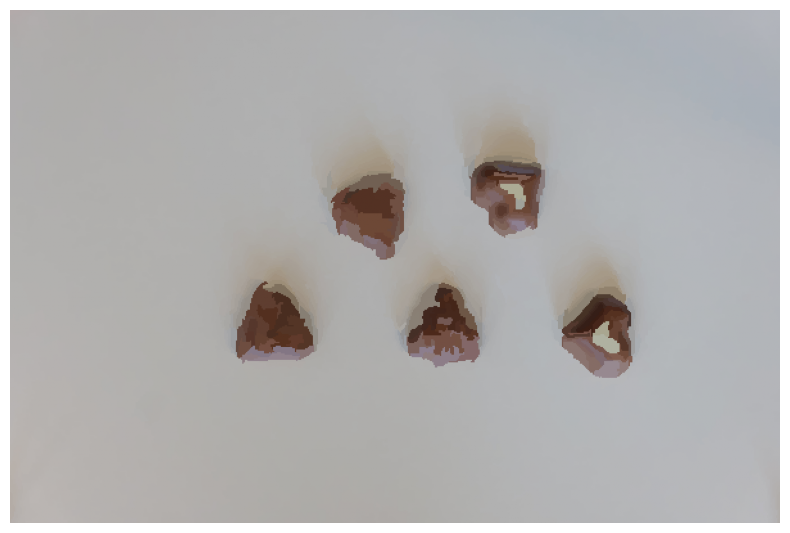

(2944, 5) [-4.09237823e-13 -2.50430790e-13 -2.06450289e-13  4.93868231e-16
 -7.26321177e-17] [1. 1. 1. 1. 1.]


In [ ]:
feat_spx = np.zeros((np.max(spx)+1, 5), dtype=float)
rows, cols = np.indices(binned.shape[:2], dtype=float)
feat_img = np.zeros_like(binned_hsv, dtype=float)
print(np.min(spx), np.max(spx))
for i in range(np.max(spx)+1):
    mask = spx == i
    feat_spx[i, 0] = np.median(binned[mask, 0])/255
    feat_spx[i, 1] = np.median(binned[mask, 1])/255
    feat_spx[i, 2] = np.median(binned[mask, 2])/255
    feat_spx[i, 3] = np.median(rows[mask])
    feat_spx[i, 4] = np.median(cols[mask])
    feat_img[mask] = feat_spx[i, :3]

plt.figure(figsize=(8, 6))
plt.imshow(feat_img)
plt.axis('off')
plt.tight_layout()
plt.show()

X = sklearn.preprocessing.StandardScaler().fit_transform(feat_spx)

print(X.shape, np.mean(X, axis=0), np.std(X, axis=0))



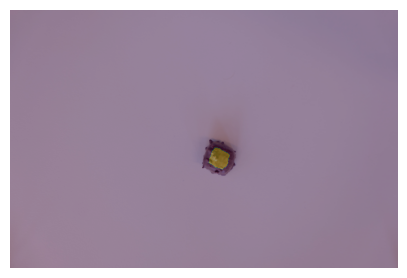

In [ ]:
reference = np.array(Image.open('../data/dataset_project_iapr2025/references/' + 'Tentation_noir.JPG'))
reference = median_bin_rgb(reference, block_size=(10, 10))
reference_mask = np.array(Image.open('../data/dataset_project_iapr2025/references_annotated/' + 'tentation_noir_annotated.tif'), dtype=bool)
reference_mask = skim.measure.block_reduce(reference_mask, block_size=(10, 10), func=np.max).astype(bool)

reference_mask = skim.morphology.erosion(reference_mask, skim.morphology.disk(10))

reference_bgr = cv2.cvtColor(reference, cv2.COLOR_RGB2BGR)
reference_hsv = cv2.cvtColor(reference_bgr, cv2.COLOR_BGR2HSV)

plt.figure(figsize=(5, 5))
plt.imshow(reference)
plt.imshow(reference_mask, alpha=0.3)
plt.axis('off')
plt.show()

In [ ]:
data = reference_hsv[reference_mask==1]

ref_feat_mean = np.zeros(3, dtype=float)


ref_feat_mean[0] = np.mean(data[:, 0])/255
ref_feat_mean[1] = np.mean(data[:, 1])/255
ref_feat_mean[2] = np.mean(data[:, 2])/255

print(ref_feat_mean)

dist_to_ref = np.zeros(np.max(spx)+1, dtype=float)
img_dist_to_ref = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
#ref_dist_to_ref = np.linalg.norm(ref_feat_mean - reference_hsv/255, axis=2)
print(np.max(spx))

for seg_id in range(np.max(spx)+1):
    mask = spx == seg_id
    dist_to_ref[seg_id] = np.linalg.norm(ref_feat_mean - feat_spx[seg_id, :3])
    img_dist_to_ref[mask] = dist_to_ref[seg_id]

viewer = napari.Viewer()
viewer.add_image(binned, name='binned')
viewer.add_image(img_dist_to_ref, name='dist to ref')
napari.run()

[0.10613552 0.46657883 0.2895244 ]
3339


NameError: name 'feat_spx' is not defined

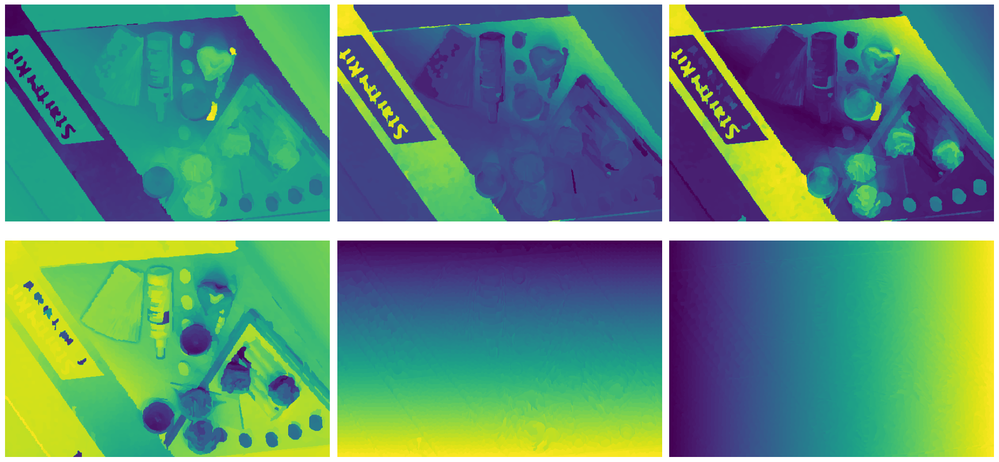

In [ ]:
huex_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
huey_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
value_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
saturation_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
posx_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)
posy_img = np.zeros((binned.shape[0], binned.shape[1]), dtype=float)

for seg_id in range(0, np.max(spx)+1):
    mask = spx == seg_id
    huex_img[mask] = X[seg_id, 0]
    huey_img[mask] = X[seg_id, 1]
    saturation_img[mask] = X[seg_id, 2]
    value_img[mask] = X[seg_id, 3]
    posx_img[mask] = X[seg_id, 4]
    posy_img[mask] = X[seg_id, 5]
plt.figure(figsize=(20, 10))
plt.subplot(2, 3, 1)
plt.imshow(huex_img)
plt.axis('off')
plt.subplot(2, 3, 2)
plt.imshow(huey_img)
plt.axis('off')
plt.subplot(2, 3, 3)
plt.imshow(saturation_img)
plt.axis('off')
plt.subplot(2, 3, 4)
plt.imshow(value_img)
plt.axis('off')
plt.subplot(2, 3, 5)
plt.imshow(posx_img)
plt.axis('off')
plt.subplot(2, 3, 6)
plt.imshow(posy_img)
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
opt = sklearn.cluster.OPTICS(min_samples=12, xi=0.1, cluster_method='xi').fit(X[:,:3])


labels = opt.labels_[spx]

viewer = napari.Viewer()

viewer.add_image(binned, name='binned')
viewer.add_labels(labels, name='clusters')
napari.run()



/home/bdapia/Documents/MasterEPFL/ImageAnalysisPatternRecongnition/iaprEnv/lib/python3.10/site-packages/sklearn/cluster/_optics.py:1086: RuntimeWarning: divide by zero encountered in divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


In [ ]:
opt = sklearn.cluster.OPTICS(min_samples=10, eps=0.5, cluster_method='dbscan').fit(X[:,:3])


labels = opt.labels_[spx]

viewer = napari.Viewer()

viewer.add_image(binned, name='binned')
viewer.add_labels(labels, name='clusters')
napari.run()

**GMM on superpixels**

In [ ]:
print(feat_spx[:,:-2].shape, X.shape)

(2944, 3) (2944, 6)


100%|██████████| 9/9 [00:00<00:00, 20.09it/s]


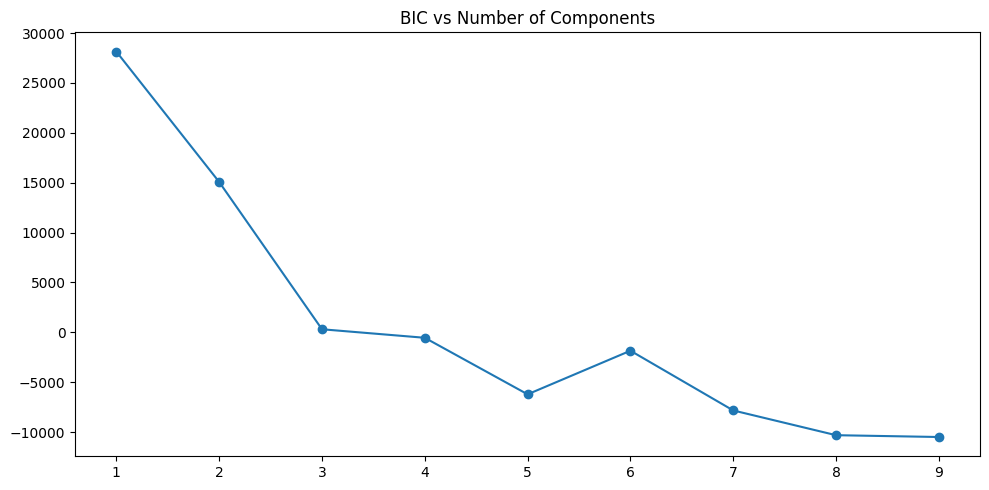

In [ ]:
best_bic = np.inf
best_gmm = None
best_n_components = 0
bics = []
components = range(1, 10)

for c in tqdm(components):
    gmm = sklearn.mixture.GaussianMixture(n_components=c, covariance_type='full', reg_covar=1e-3)
    gmm.fit(X[:,:-2])
    bic = gmm.bic(X[:,:-2])
    bics.append(bic)
    if bic < best_bic:
        best_bic = bic
        best_gmm = gmm
        best_n_components = c

plt.figure(figsize=(10, 5))
plt.plot(components, bics, marker='o')
plt.title('BIC vs Number of Components')
plt.tight_layout()
plt.show()  

In [ ]:
print(X.shape, X[spx].shape, X[spx][:,:,:-2].shape)
labels = best_gmm.predict(X[spx][:,:,:-2].reshape((-1, 4)))
labels = labels.reshape((binned.shape[0], binned.shape[1], -1))
print(labels.shape)
print(np.min(labels), np.max(labels))
#labels[~empirical_mask] = np.max(labels)+1
labels = labels.reshape(binned.shape[0], binned.shape[1])

viewer = napari.Viewer()
viewer.add_image(binned)
viewer.add_labels(labels)
napari.run()

(2944, 6) (400, 600, 6) (400, 600, 4)
(400, 600, 1)
0 8


/home/bdapia/Documents/MasterEPFL/ImageAnalysisPatternRecongnition/iaprEnv/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


label0: [0.42192049 0.03486328 0.71943481]
label1: [0.10190772 0.19048225 0.53794611]
label2: [0.05245098 0.03622296 0.70125264]
label3: [0.14846173 0.00865855 0.68813155]
label4: [0.06030649 0.00161453 0.68769293]
label5: [0.09731473 0.01760979 0.6868667 ]
label6: [0.06953343 0.45100364 0.38686322]
label7: [0.4251007  0.07337452 0.61236013]
label8: [0.08072128 0.07746128 0.66541158]
ref: [0.10613552 0.46657883 0.2895244 ]


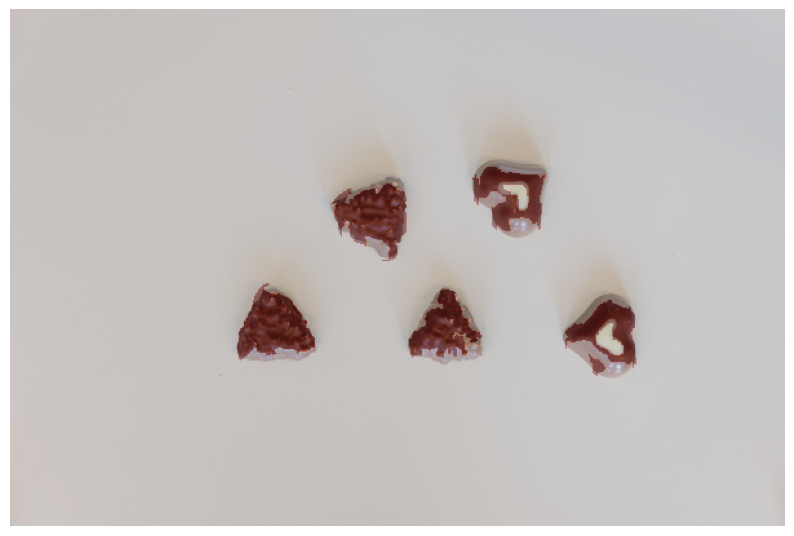

In [ ]:
labels_mean = np.zeros((np.max(labels)+1,3))
for i in range(len(labels_mean)):
    labels_mean[i] = np.mean(binned_hsv[labels==i], axis=0)/255
    print(f'label{i}: {labels_mean[i]}')
    
data = reference_hsv[reference_mask]/255
print(f'ref: {np.mean(data, axis=0)}')

dists = np.linalg.norm(labels_mean-np.mean(data, axis=0), axis=1)
chocolate_label=np.argmin(dists)

binary = labels==chocolate_label

plt.figure(figsize=(10,7))
plt.imshow(binned)
plt.imshow(binary, alpha=0.3, cmap='Reds')
plt.axis('off')
plt.show()

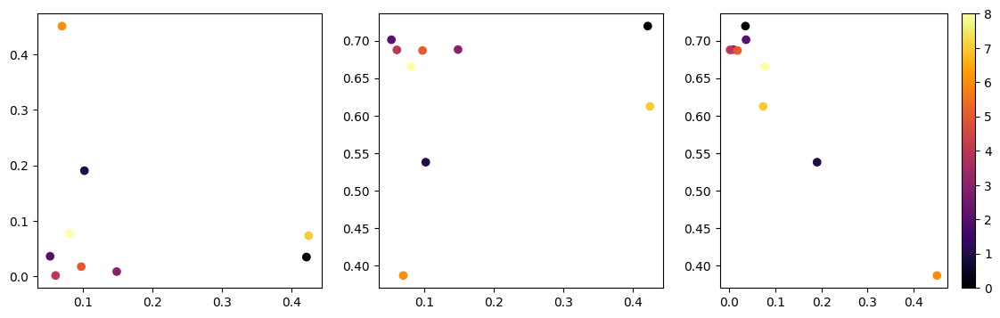

In [ ]:
plt.figure(figsize=(14,4))
plt.subplot(1, 3, 1)
plt.scatter(labels_mean[:,0], labels_mean[:,1], cmap='inferno', c=np.arange(labels_mean.shape[0]))
plt.subplot(1, 3, 2)
plt.scatter(labels_mean[:,0], labels_mean[:,2], cmap='inferno', c=np.arange(labels_mean.shape[0]))
plt.subplot(1, 3, 3)
plt.scatter(labels_mean[:,1], labels_mean[:,2], cmap='inferno', c=np.arange(labels_mean.shape[0]))
plt.colorbar()
plt.show()

### Binary image processing


In [ ]:
processed = skim.morphology.remove_small_holes(binary, area_threshold=200)
#processed = skim.morphology.remove_small_objects(processed, min_size=50)
processed = skim.morphology.binary_closing(processed, skim.morphology.disk(9))

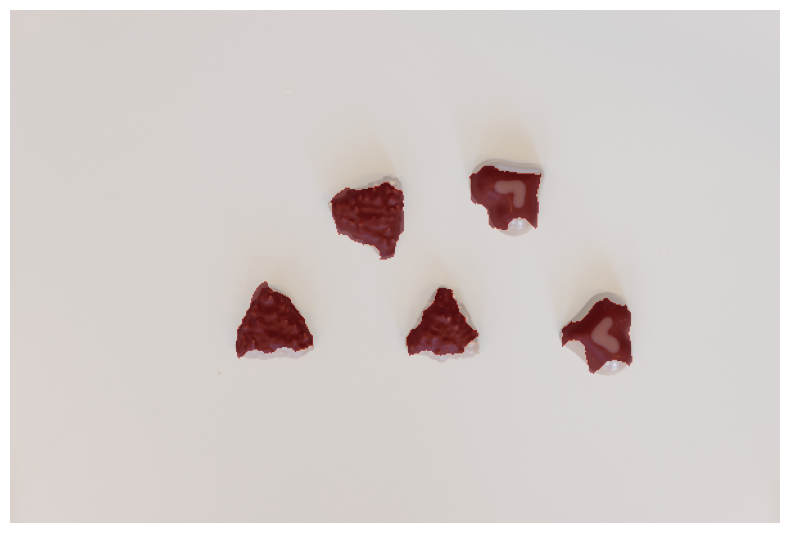

In [ ]:
plt.figure(figsize=(8, 8))
plt.imshow(binned)
plt.imshow(processed, alpha=0.5, cmap='Reds')
plt.axis('off')
plt.tight_layout()
plt.show()

### on continue au propre

In [102]:
import skimage as skim
import sklearn 
import cv2
import numpy as np
import os

import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import napari
%load_ext autoreload
%autoreload 2
import _utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [104]:
train_data_path = '../data/dataset_project_iapr2025/train/'
img = np.array(Image.open(train_data_path + 'L1010045.JPG'))
binned = _utils.median_bin_rgb(img, block_size=(10, 10))

binned_bgr = cv2.cvtColor(binned, cv2.COLOR_RGB2BGR)
binned_hsv = cv2.cvtColor(binned_bgr, cv2.COLOR_BGR2HSV)

spx = skim.segmentation.slic(binned, n_segments=5000, compactness=.1, sigma=1, start_label=0)

In [105]:
hsv_feat = _utils.hsv_spx_feat(binned_hsv, spx, np.median)
gmm = _utils.gmm_on_spx_fit(range(1,15), hsv_feat)
labels = _utils.gmm_on_spx_predict(gmm, hsv_feat[spx], spx)

In [107]:
viewer = napari.Viewer()
viewer.add_image(binned)
viewer.add_labels(labels)

<Labels layer 'labels' at 0x2122bd6f410>

label0: [0.44688801 0.02359602 0.78248871],  dist to ref: 0.7452246928505911
label1: [0.07797898 0.00183834 0.74611632],  dist to ref: 0.652114021356742
label2: [0.34931709 0.10575161 0.69807007],  dist to ref: 0.596861053884716
label3: [0.08154224 0.11913556 0.69540265],  dist to ref: 0.53484465808186
label4: [0.44057693 0.25180406 0.42474691],  dist to ref: 0.4198385208572627
label5: [0.57163801 0.01736044 0.76273977],  dist to ref: 0.8015126409110259
label6: [0.16657143 0.1229554  0.22855596],  dist to ref: 0.35418457659206515
label7: [0.04408902 0.78966167 0.82786834],  dist to ref: 0.6309092567526471
label8: [0.48468299 0.51580029 0.59530801],  dist to ref: 0.48910586723730626
label9: [0.1146236  0.05821289 0.73594639],  dist to ref: 0.6050846070076636
label10: [0.45940645 0.01239452 0.76369946],  dist to ref: 0.7456042622273038
label11: [0.10443676 0.3623681  0.62952728],  dist to ref: 0.3556187890323869
label12: [0.08189754 0.60359575 0.52413314],  dist to ref: 0.272767988099420

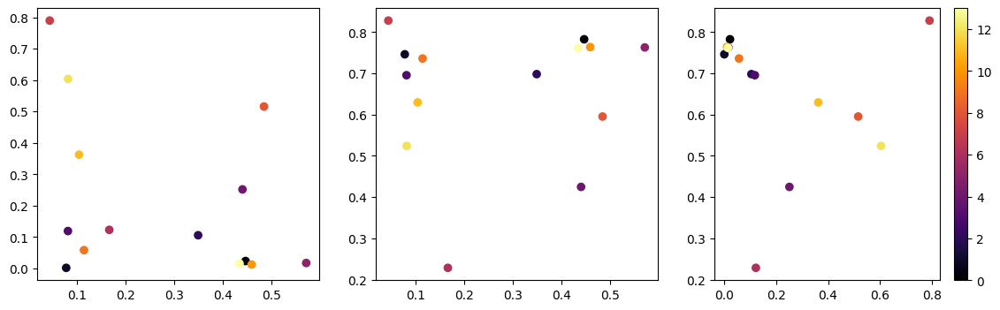

In [106]:
labels_mean = np.zeros((np.max(labels)+1,3))
ref = np.array([0.10613552, 0.46657883, 0.2895244])
for i in range(len(labels_mean)):
    labels_mean[i] = np.mean(binned_hsv[labels==i], axis=0)/255
    dist_to_ref=np.linalg.norm(labels_mean[i]-ref)
    print(f'label{i}: {labels_mean[i]},  dist to ref: {dist_to_ref}')


plt.figure(figsize=(14,4))
plt.subplot(1, 3, 1)
plt.scatter(labels_mean[:,0], labels_mean[:,1], cmap='inferno', c=np.arange(labels_mean.shape[0]))
plt.subplot(1, 3, 2)
plt.scatter(labels_mean[:,0], labels_mean[:,2], cmap='inferno', c=np.arange(labels_mean.shape[0]))
plt.subplot(1, 3, 3)
plt.scatter(labels_mean[:,1], labels_mean[:,2], cmap='inferno', c=np.arange(labels_mean.shape[0]))
plt.colorbar()
plt.show()

### Region Growing

(np.float64(-0.5), np.float64(599.5), np.float64(399.5), np.float64(-0.5))

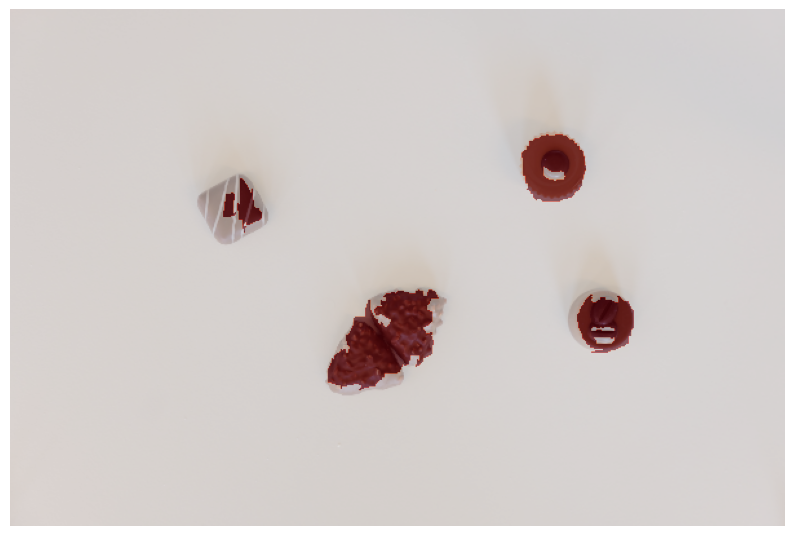

In [34]:
label2 = (labels == 2)
plt.figure(figsize=(10, 10))
plt.imshow(binned)
plt.imshow(label2, alpha=0.5, cmap='Reds')
plt.axis('off')


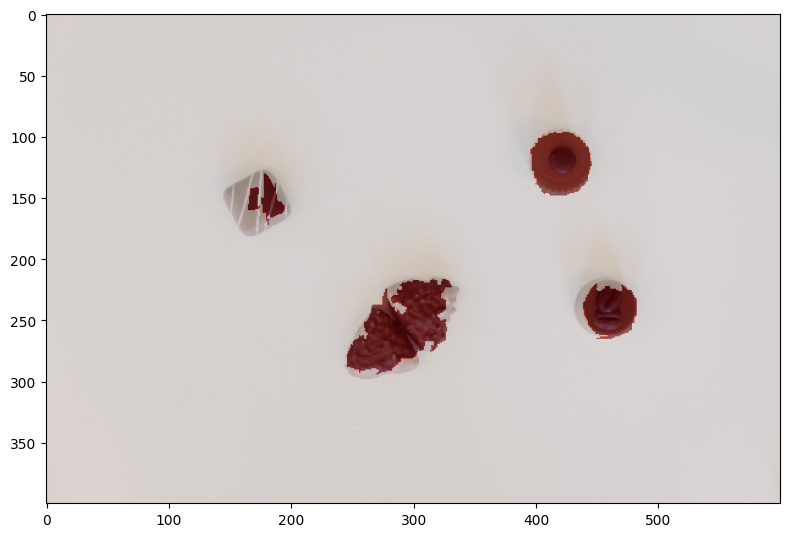

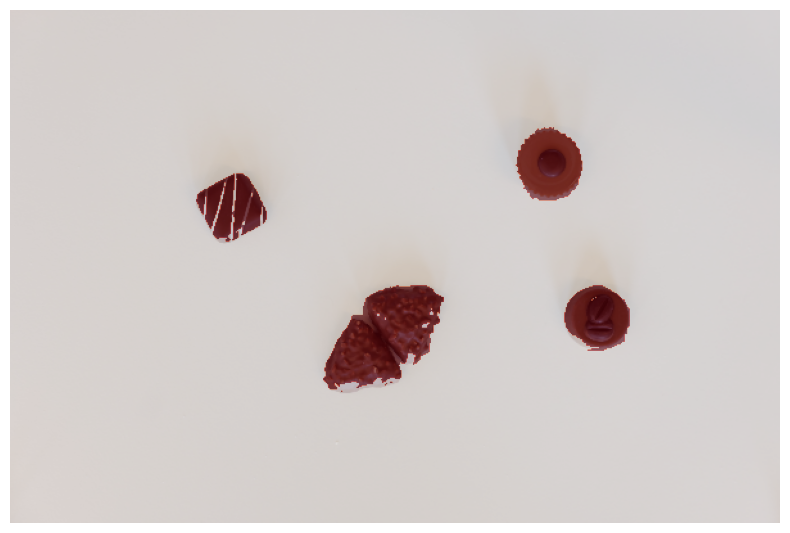

In [100]:
# hsv_img = skim.color.rgb2hsv(binned)

processed = skim.morphology.remove_small_holes(label2, area_threshold=200)
processed = skim.morphology.remove_small_objects(processed, min_size=50)
processed = processed.astype(np.uint8)

contours, _ = cv2.findContours(processed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

masque = np.zeros_like(processed)

cv2.drawContours(masque, contours, -1, 255, thickness=cv2.FILLED)

masque = masque.astype(bool)

plt.figure(figsize=(8, 8))
plt.imshow(binned)
plt.imshow(masque, alpha=0.5, cmap='Reds')
plt.axis('on')
plt.tight_layout()
plt.show()

rg_total = np.zeros_like(masque)

for contour in contours:

    masque = np.zeros_like(processed)

    cv2.drawContours(masque, [contour], -1, 255, thickness=cv2.FILLED)

    masque = masque.astype(bool)
    
    # plt.figure(figsize=(8, 8))
    # #plt.imshow(binned)
    # plt.imshow(masque)
    # plt.axis('off')
    # plt.tight_layout()
    # plt.show()

    red_channel = binned[:,:,0]
    green_channel = binned[:,:,1]
    blue_channel = binned[:,:,2]

    mean_red = np.mean(red_channel[masque])
    mean_green = np.mean(green_channel[masque])
    mean_blue = np.mean(blue_channel[masque])

    # mean_red_t = np.mean(red_channel)
    # mean_green_t = np.mean(green_channel)
    # mean_blue_t = np.mean(blue_channel)

    # print("mean: ", mean_red, mean_green, mean_blue)
    # print("mean tot: ", mean_red_t, mean_green_t, mean_blue_t)
    
    rg = masque.copy()
    #rg = skim.morphology.binary_dilation(rg, skim.morphology.disk(5))

    offset_red = 60
    offset_green = 60
    offset_blue = 60
    
    # binned_labelled = ((binned[:,:,1] < binned[:,:,0]) & (binned[:,:,2] < binned[:,:,0]) & (binned[:,:,2] < 10 - binned[:,:,1]) &
    #                (hsv_img[:,:,0] < 0.2) & (hsv_img[:,:,1] < 0.9) & (hsv_img[:,:,2] < 1.1 - hsv_img[:,:,1]))
    binned_labelled = ((binned[:,:,0] < mean_red + offset_red) & (binned[:,:,0] > mean_red - offset_red) & (binned[:,:,1] < mean_green + offset_green) &
                      (binned[:,:,1] > mean_green - offset_green) & (binned[:,:,2] < mean_blue + offset_blue) & (binned[:,:,2] > mean_blue - offset_blue))
    
    # plt.figure(figsize=(8, 8))
    # plt.imshow(binned)
    # plt.imshow(binned_labelled, alpha=0.5, cmap='Reds')
    # plt.axis('off')
    # plt.tight_layout()
    # plt.show()
    
    n_iterations = 3
    
    for i in range(n_iterations):         
        rg |= (skim.morphology.binary_dilation(rg, skim.morphology.disk(10)) & binned_labelled)     
        
        # print(i, ": ")
        # plt.figure(figsize=(10, 10))
        # plt.imshow(binned)
        # plt.imshow(rg, alpha=0.5, cmap='Reds')
        # plt.axis('off')

    rg_total |= (rg == 1)
    
plt.figure(figsize=(8, 8))
plt.imshow(binned)
plt.imshow(rg_total, alpha=0.5, cmap='Reds')
plt.axis('off')
plt.tight_layout()
plt.show()

### Sur tout le train set

**Test sur tout le train set**


  0%|          | 0/180 [00:00<?, ?it/s]

 11%|█         | 20/180 [02:04<16:07,  6.05s/it]/tmp/ipykernel_69334/1837462522.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6,4))
 23%|██▎       | 41/180 [04:22<14:51,  6.41s/it]


KeyboardInterrupt: 

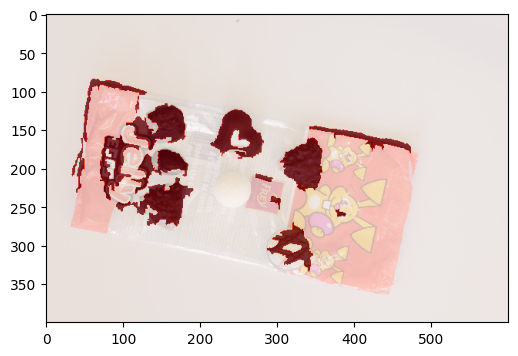

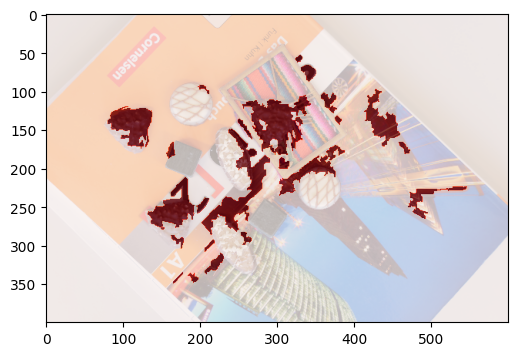

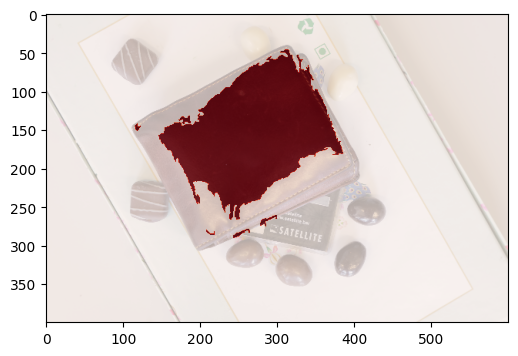

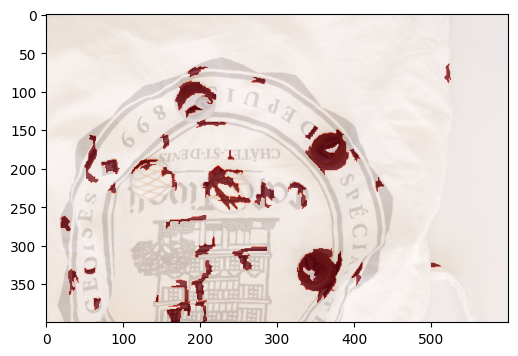

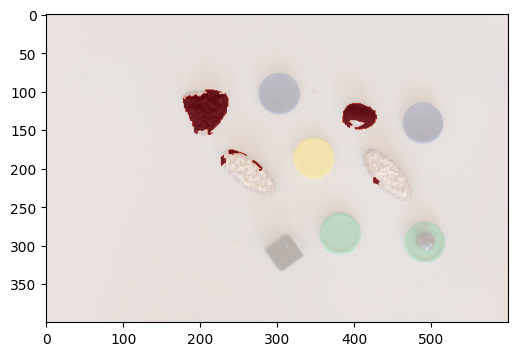

...

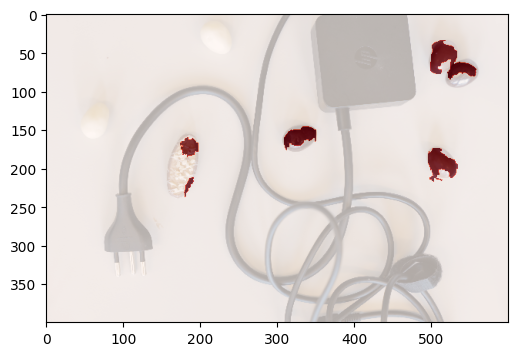

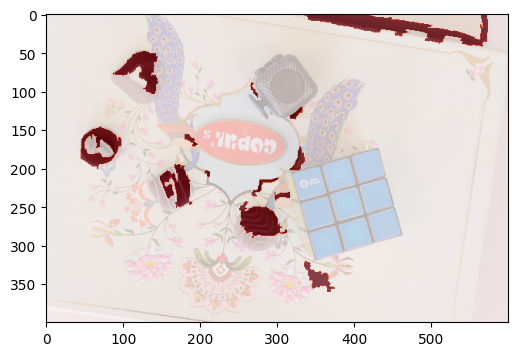

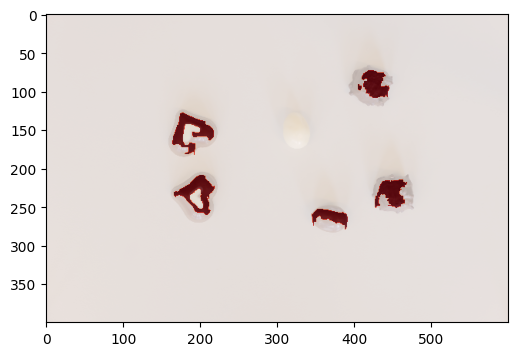

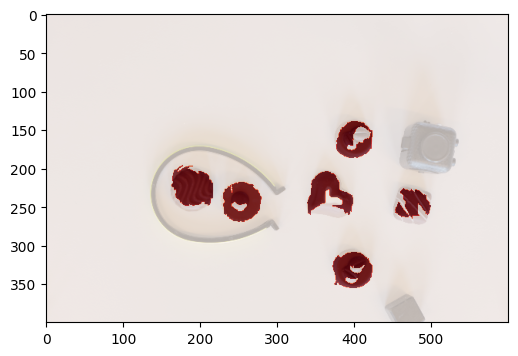

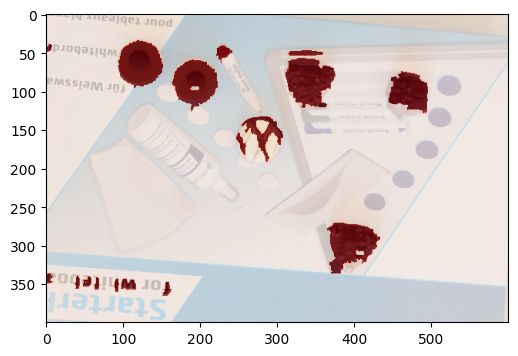

In [ ]:
test_data_path = '../data/dataset_project_iapr2025/test'
save_data_path = '../data/dataset_project_iapr2025/binary_masks'

for filename in tqdm(os.listdir(test_data_path)):
    full_path = os.path.join(test_data_path, filename)
    if os.path.isfile(full_path):
        img = np.array(Image.open(full_path))
        binned = median_bin_rgb(img, block_size=(10, 10))

        binned_bgr = cv2.cvtColor(binned, cv2.COLOR_RGB2BGR)
        binned_hsv = cv2.cvtColor(binned_bgr, cv2.COLOR_BGR2HSV)

        spx = skim.segmentation.slic(binned, n_segments=5000, compactness=.1, sigma=1, start_label=0)

        hsv_feat = _utils.hsv_spx_feat(binned_hsv, spx, np.median)
        gmm = _utils.gmm_on_spx_fit(range(1,15), hsv_feat)
        labels = _utils.gmm_on_spx_predict(gmm, hsv_feat[spx], spx)

        labels_mean = np.zeros((np.max(labels)+1,3))
        ref = np.array([0.10613552, 0.46657883, 0.2895244])
        for i in range(len(labels_mean)):
            labels_mean[i] = np.mean(binned_hsv[labels==i], axis=0)/255
        dists_to_ref = np.linalg.norm(labels_mean - ref, axis=1)
        binary = labels==np.argmin(dists_to_ref)

        plt.figure(figsize=(6,4))
        plt.imshow(binned)
        plt.imshow(binary, alpha=0.7, cmap='Reds')
        plt.savefig(save_data_path+'/'+filename)
        plt.close()
        

        